CREDIT RISK

This project endeavors to develop a sophisticated machine-learning model aimed at accurately predicting the probability of successfully collecting debts by meticulously examining the statute-barred status of each account. 


Importing all necessary libraries

In [3]:
import os 
import pandas as pd 
import numpy as np 
import matplotlib.pyplot as plt 
import warnings 
warnings.filterwarnings('ignore') 
%matplotlib inline 
import seaborn as sns 
sns.set()

In [4]:
pwd

'C:\\Users\\rinke\\K_SUNDARAM SIR'

Importing dataset

In [5]:
df=pd.read_excel('Company_x.xlsx')


In [6]:
# View of all columns
pd.set_option('display.max_columns', None)
df.head()

,EntityID,OriginalCreditor[Redacted],AccountID,CurrentBalance,DebtLoadPrincipal,BalanceAtDebtLoad,PurchasePrice,ProductOrDebtType,CollectionStatus,IsStatBarred,ClosureReason,InBankruptcy,AccountInsolvencyType,CustomerInsolvencyType,IsLegal,LastPaymentAmount,LastPaymentMethod,NumLiableParties,CustomerAge,NumPhones,NumEmails,NumAddresses,Unnamed: 22,Unnamed: 23,Unnamed: 24,Unnamed: 25
0,932,Creditor 1,3677,0.0,1160.20,1160.20,4.22,Other,PAID_IN_FULL,N,NaN,N,NaN,NaN,Y,10.00,Cheque,1.0,53.0,0,0,1,NaN,NaN,NaN,NaN
1,160,Creditor 2,4276,182.9,182.90,182.90,4.22,Other,CANCELLED_WITHDRAWN,Y,NaN,N,NaN,NaN,N,NaN,NaN,1.0,NaN,0,0,1,NaN,NaN,NaN,NaN
2,932,Creditor 1,8525,0.0,538.57,538.57,4.22,Other,PAID_IN_FULL,N,NaN,N,NaN,NaN,N,5.37,Cheque,1.0,NaN,1,0,1,NaN,NaN,NaN,NaN
3,160,Creditor 2,9859,8279.5,8279.50,8279.50,4.22,Other,PASSIVE,Y,NaN,N,NaN,NaN,N,NaN,NaN,1.0,NaN,1,0,1,NaN,NaN,NaN,NaN
4,932,Creditor 1,12807,0.0,523.00,523.00,4.22,Other,PAID_IN_FULL,Y,NaN,N,NaN,NaN,Y,5.00,Cheque,1.0,46.0,2,0,1,NaN,NaN,NaN,NaN


In [7]:
df.drop(['Unnamed: 22','Unnamed: 23','Unnamed: 24','Unnamed: 25'],axis=1,inplace=True)

In [8]:
df.describe()

,EntityID,AccountID,CurrentBalance,DebtLoadPrincipal,BalanceAtDebtLoad,PurchasePrice,LastPaymentAmount,NumLiableParties,CustomerAge,NumPhones,NumEmails,NumAddresses
count,4.064230e+05,4.064230e+05,406423.000000,406423.000000,406423.000000,403731.000000,103977.000000,406301.000000,376941.000000,406423.000000,406423.000000,406423.000000
mean,3.970443e+07,3.954380e+08,1301.866266,1539.010928,1600.933847,5.618606,283.896947,1.017145,45.728061,0.435652,0.208113,0.847354
std,4.698070e+07,4.654769e+08,4030.513710,4416.229311,4531.889319,5.441934,1119.842219,0.132866,12.950395,0.714852,0.434321,0.459690
min,1.600000e+02,3.677000e+03,-7717.200000,0.000000,0.000000,0.190000,0.010000,1.000000,-41.000000,0.000000,0.000000,0.000000
25%,3.010600e+06,3.023088e+07,85.330000,246.970000,249.875000,3.070000,20.000000,1.000000,36.000000,0.000000,0.000000,1.000000
50%,3.010949e+06,3.045075e+07,457.510000,619.000000,630.740000,4.220000,40.000000,1.000000,44.000000,0.000000,0.000000,1.000000
75%,9.990131e+07,9.901891e+08,1159.365000,1393.780000,1433.755000,6.590000,142.900000,1.000000,54.000000,1.000000,0.000000,1.000000
max,9.990159e+07,9.904958e+08,441681.520000,844343.000000,844343.000000,52.180000,73131.840000,4.000000,133.000000,8.000000,5.000000,7.000000


In [9]:
# description of the categorical data
df.describe(include='O')

,OriginalCreditor[Redacted],ProductOrDebtType,CollectionStatus,IsStatBarred,ClosureReason,InBankruptcy,AccountInsolvencyType,CustomerInsolvencyType,IsLegal,LastPaymentMethod
count,406423,406423,406423,406423,9030,406423,285,8531,406423,103977
unique,52,10,12,2,14,2,5,13,2,9
top,Creditor 17,Utilities/Telco - Other,ACTIVE,Y,Insolvent,N,LIQUIDATION_NOP,BANKRUPT,N,Cheque
freq,84768,212158,169489,284548,5634,398270,161,3809,396709,54154


In [10]:
df.columns

Index(['EntityID', 'OriginalCreditor[Redacted]', 'AccountID', 'CurrentBalance',
       'DebtLoadPrincipal', 'BalanceAtDebtLoad', 'PurchasePrice',
       'ProductOrDebtType', 'CollectionStatus', 'IsStatBarred',
       'ClosureReason', 'InBankruptcy', 'AccountInsolvencyType',
       'CustomerInsolvencyType', 'IsLegal', 'LastPaymentAmount',
       'LastPaymentMethod', 'NumLiableParties', 'CustomerAge', 'NumPhones',
       'NumEmails', 'NumAddresses'],
      dtype='object')

In [11]:
# checking the information of the data
df.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 406423 entries, 0 to 406422
Data columns (total 22 columns):
 #   Column                      Non-Null Count   Dtype  
---  ------                      --------------   -----  
 0   EntityID                    406423 non-null  int64  
 1   OriginalCreditor[Redacted]  406423 non-null  object 
 2   AccountID                   406423 non-null  int64  
 3   CurrentBalance              406423 non-null  float64
 4   DebtLoadPrincipal           406423 non-null  float64
 5   BalanceAtDebtLoad           406423 non-null  float64
 6   PurchasePrice               403731 non-null  float64
 7   ProductOrDebtType           406423 non-null  object 
 8   CollectionStatus            406423 non-null  object 
 9   IsStatBarred                406423 non-null  object 
 10  ClosureReason               9030 non-null    object 
 11  InBankruptcy                406423 non-null  object 
 12  AccountInsolvencyType       285 non-null     object 
 13  CustomerInsolv

Pandas profiling

In [12]:
import pandas as pd
from pandas_profiling import ProfileReport


In [13]:
profile = ProfileReport(df, title='Dataset Profiling Report', explorative=True)
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Certainly, here's a properly drafted version of the insights you've identified:

**Insights:**

1. **Creditor Analysis:**
   - Notable creditors contributing to the dataset include Creditor 17, Creditor 33, Creditor 47, Creditor 48, and Creditor 7, indicating their significance in the dataset.

2. **Purchase Price Outliers:**
   - There are outliers in the "Purchase Price" variable, with the maximum count of offers reaching 4.

3. **Prominent Debt Types:**
   - The most common "Product/Debt Type" categories include Utilities/Telc and "Other," with 84,218 cases, followed by Finance.

4. **Collection Status:**
   - The dataset has a significant number of active cases, indicating the presence of ongoing collections.

5. **Statute-Barred Cases:**
   - There are cases where the "IsStatBarred" status is true, which could imply cases where the statute of limitations has expired.

6. **Closure Reasons:**
   - The most common "Closure Reason" is "Insolvent," followed by "Statute Barred." Notably, this variable has 97.8% missing data.

7. **In-Bankruptcy Cases:**
   - A significant number of cases have "InBankruptcy" status set to false.

8. **Account Insolvency Type:**
   - "AccountInsolvencyType" has only 285 available data points, with 99.9% of data missing.

9. **IsLegal Status:**
   - The "IsLegal" status is predominantly false.

10. **Payment Methods:**
    - Many cases involve payments made via cheque.

11. **Number of Liable Parties:**
    - The maximum count of liable parties for a case is 1.

12. **Customer Age Distribution:**
    - The most common "Customer Age" count is 35.

13. **Counts of Contact Information:**
    - Most cases have a single phone number, email, and address, but there are some cases with up to two addresses.

**Correlation Analysis:**

1. **Entity ID and Account ID Correlation with Account Insolvency:**
   - There's a high correlation between "Entity ID" and "Account ID" with "AccountInsolvency," indicating that these IDs may be linked to account insolvency status.

2. **Debt Load and Balanced Debt Correlation:**
   - "Debt Load" and "Balanced Debt" show a strong correlation, suggesting they may provide similar information.

3. **Balanced Debt and Account Insolvency Correlation:**
   - "Balanced Debt" has a significant correlation with "AccountInsolvency," which may be a relevant factor.

4. **Purchase Price and Creditor[Redacted] Correlation:**
   - There is a correlation between "Purchase Price" and "Creditor[Redacted]," which could be related to the creditor's lending practices.

5. **Creditor[Redacted] Correlation:**
   - "Creditor[Redacted]" is correlated with "Entity ID," "Account ID," "Purchase Price," and "Product/Debt Type," indicating its influence in various aspects.

6. **Collection Status and Closure Reason Correlation:**
   - "Collection Status" and "Closure Reason" exhibit a high correlation, suggesting a connection between the status of collections and the reasons for closure.

7. **Closure Reason Correlation with Collection Status:**
   - "Closure Reason" is highly correlated with "Collection Status," reflecting the reasons for closing a case and the status of collections.

These insights and correlations can guide further data analysis and modeling strategies.

In [14]:
df.head()

,EntityID,OriginalCreditor[Redacted],AccountID,CurrentBalance,DebtLoadPrincipal,BalanceAtDebtLoad,PurchasePrice,ProductOrDebtType,CollectionStatus,IsStatBarred,ClosureReason,InBankruptcy,AccountInsolvencyType,CustomerInsolvencyType,IsLegal,LastPaymentAmount,LastPaymentMethod,NumLiableParties,CustomerAge,NumPhones,NumEmails,NumAddresses
0,932,Creditor 1,3677,0.0,1160.20,1160.20,4.22,Other,PAID_IN_FULL,N,NaN,N,NaN,NaN,Y,10.00,Cheque,1.0,53.0,0,0,1
1,160,Creditor 2,4276,182.9,182.90,182.90,4.22,Other,CANCELLED_WITHDRAWN,Y,NaN,N,NaN,NaN,N,NaN,NaN,1.0,NaN,0,0,1
2,932,Creditor 1,8525,0.0,538.57,538.57,4.22,Other,PAID_IN_FULL,N,NaN,N,NaN,NaN,N,5.37,Cheque,1.0,NaN,1,0,1
3,160,Creditor 2,9859,8279.5,8279.50,8279.50,4.22,Other,PASSIVE,Y,NaN,N,NaN,NaN,N,NaN,NaN,1.0,NaN,1,0,1
4,932,Creditor 1,12807,0.0,523.00,523.00,4.22,Other,PAID_IN_FULL,Y,NaN,N,NaN,NaN,Y,5.00,Cheque,1.0,46.0,2,0,1


Data preprocessing: we'll be handling missing values, dealing with outliers, and converting data into a suitable format.

In [15]:
df['AccountID'].nunique()

406423

In [16]:
df['EntityID'].nunique()

229

Dropping account id and enity id as Removing features with high duplicate values in a dataset is not typically done because of high cardinality, but rather because these duplicate or near-duplicate features can negatively impact the performance of machine learning models and add unnecessary complexity to our data analysis. 

In [17]:
df.drop(['AccountID', 'EntityID'], axis=1, inplace=True)


In [18]:
df.head()

,OriginalCreditor[Redacted],CurrentBalance,DebtLoadPrincipal,BalanceAtDebtLoad,PurchasePrice,ProductOrDebtType,CollectionStatus,IsStatBarred,ClosureReason,InBankruptcy,AccountInsolvencyType,CustomerInsolvencyType,IsLegal,LastPaymentAmount,LastPaymentMethod,NumLiableParties,CustomerAge,NumPhones,NumEmails,NumAddresses
0,Creditor 1,0.0,1160.20,1160.20,4.22,Other,PAID_IN_FULL,N,NaN,N,NaN,NaN,Y,10.00,Cheque,1.0,53.0,0,0,1
1,Creditor 2,182.9,182.90,182.90,4.22,Other,CANCELLED_WITHDRAWN,Y,NaN,N,NaN,NaN,N,NaN,NaN,1.0,NaN,0,0,1
2,Creditor 1,0.0,538.57,538.57,4.22,Other,PAID_IN_FULL,N,NaN,N,NaN,NaN,N,5.37,Cheque,1.0,NaN,1,0,1
3,Creditor 2,8279.5,8279.50,8279.50,4.22,Other,PASSIVE,Y,NaN,N,NaN,NaN,N,NaN,NaN,1.0,NaN,1,0,1
4,Creditor 1,0.0,523.00,523.00,4.22,Other,PAID_IN_FULL,Y,NaN,N,NaN,NaN,Y,5.00,Cheque,1.0,46.0,2,0,1


In [19]:
df.corr()

,CurrentBalance,DebtLoadPrincipal,BalanceAtDebtLoad,PurchasePrice,LastPaymentAmount,NumLiableParties,CustomerAge,NumPhones,NumEmails,NumAddresses
CurrentBalance,1.000000,0.858061,0.858967,0.090113,-0.033963,0.104228,0.025054,-0.018564,0.062759,-0.052205
DebtLoadPrincipal,0.858061,1.000000,0.998414,0.115882,0.296951,0.130913,0.036457,0.071420,0.121837,-0.011625
BalanceAtDebtLoad,0.858967,0.998414,1.000000,0.116890,0.302631,0.130435,0.039216,0.074213,0.120568,-0.012475
PurchasePrice,0.090113,0.115882,0.116890,1.000000,0.031544,0.011712,-0.039574,0.099802,0.122593,-0.013140
LastPaymentAmount,-0.033963,0.296951,0.302631,0.031544,1.000000,0.057602,0.035586,0.086714,0.097052,0.045330
NumLiableParties,0.104228,0.130913,0.130435,0.011712,0.057602,1.000000,0.023431,0.102486,0.117995,0.143976
CustomerAge,0.025054,0.036457,0.039216,-0.039574,0.035586,0.023431,1.000000,-0.042901,-0.167092,0.044451
NumPhones,-0.018564,0.071420,0.074213,0.099802,0.086714,0.102486,-0.042901,1.000000,0.348925,0.152098
NumEmails,0.062759,0.121837,0.120568,0.122593,0.097052,0.117995,-0.167092,0.348925,1.000000,0.057073
NumAddresses,-0.052205,-0.011625,-0.012475,-0.013140,0.045330,0.143976,0.044451,0.152098,0.057073,1.000000


DebtLoadPrincipal: The principal amount of the debt load.

BalanceAtDebtLoad: The balance at the time of debt load.

As both are highly correlaed therfore dropping one of the features ; Balance At debt load

In [20]:
df.drop(['BalanceAtDebtLoad'], axis=1,inplace=True)

In [21]:
df.head()

,OriginalCreditor[Redacted],CurrentBalance,DebtLoadPrincipal,PurchasePrice,ProductOrDebtType,CollectionStatus,IsStatBarred,ClosureReason,InBankruptcy,AccountInsolvencyType,CustomerInsolvencyType,IsLegal,LastPaymentAmount,LastPaymentMethod,NumLiableParties,CustomerAge,NumPhones,NumEmails,NumAddresses
0,Creditor 1,0.0,1160.20,4.22,Other,PAID_IN_FULL,N,NaN,N,NaN,NaN,Y,10.00,Cheque,1.0,53.0,0,0,1
1,Creditor 2,182.9,182.90,4.22,Other,CANCELLED_WITHDRAWN,Y,NaN,N,NaN,NaN,N,NaN,NaN,1.0,NaN,0,0,1
2,Creditor 1,0.0,538.57,4.22,Other,PAID_IN_FULL,N,NaN,N,NaN,NaN,N,5.37,Cheque,1.0,NaN,1,0,1
3,Creditor 2,8279.5,8279.50,4.22,Other,PASSIVE,Y,NaN,N,NaN,NaN,N,NaN,NaN,1.0,NaN,1,0,1
4,Creditor 1,0.0,523.00,4.22,Other,PAID_IN_FULL,Y,NaN,N,NaN,NaN,Y,5.00,Cheque,1.0,46.0,2,0,1


In [22]:
df.isnull().mean()*100

OriginalCreditor[Redacted]     0.000000
CurrentBalance                 0.000000
DebtLoadPrincipal              0.000000
PurchasePrice                  0.662364
ProductOrDebtType              0.000000
CollectionStatus               0.000000
IsStatBarred                   0.000000
ClosureReason                 97.778177
InBankruptcy                   0.000000
AccountInsolvencyType         99.929876
CustomerInsolvencyType        97.900955
IsLegal                        0.000000
LastPaymentAmount             74.416556
LastPaymentMethod             74.416556
NumLiableParties               0.030018
CustomerAge                    7.254019
NumPhones                      0.000000
NumEmails                      0.000000
NumAddresses                   0.000000
dtype: float64

There are total 406423 entries and below columns has null values


ClosureReason               97.77%

AccountInsolvencyType       99.92%

CustomerInsolvencyType      97.90%

CustomerAge                 7.25%

LastPaymentAmount           74.41%

LastPaymentMethod           74.41%

PurchasePrice               0.662%

In [23]:
# handling customer data
df['CustomerAge'].dtype


dtype('float64')

In [24]:
df.head()

,OriginalCreditor[Redacted],CurrentBalance,DebtLoadPrincipal,PurchasePrice,ProductOrDebtType,CollectionStatus,IsStatBarred,ClosureReason,InBankruptcy,AccountInsolvencyType,CustomerInsolvencyType,IsLegal,LastPaymentAmount,LastPaymentMethod,NumLiableParties,CustomerAge,NumPhones,NumEmails,NumAddresses
0,Creditor 1,0.0,1160.20,4.22,Other,PAID_IN_FULL,N,NaN,N,NaN,NaN,Y,10.00,Cheque,1.0,53.0,0,0,1
1,Creditor 2,182.9,182.90,4.22,Other,CANCELLED_WITHDRAWN,Y,NaN,N,NaN,NaN,N,NaN,NaN,1.0,NaN,0,0,1
2,Creditor 1,0.0,538.57,4.22,Other,PAID_IN_FULL,N,NaN,N,NaN,NaN,N,5.37,Cheque,1.0,NaN,1,0,1
3,Creditor 2,8279.5,8279.50,4.22,Other,PASSIVE,Y,NaN,N,NaN,NaN,N,NaN,NaN,1.0,NaN,1,0,1
4,Creditor 1,0.0,523.00,4.22,Other,PAID_IN_FULL,Y,NaN,N,NaN,NaN,Y,5.00,Cheque,1.0,46.0,2,0,1


<AxesSubplot:ylabel='PurchasePrice'>

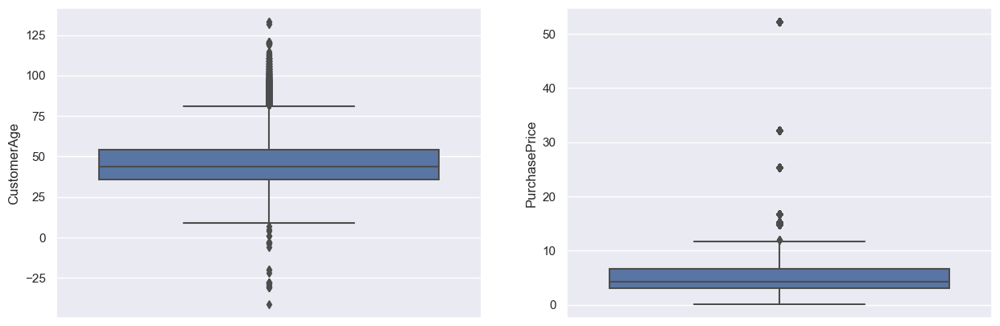

In [25]:
plt.figure(figsize=(15,5))
plt.subplot(1,2,1)
sns.boxplot(y=df['CustomerAge'])

plt.subplot(1,2,2)
sns.boxplot(y=df['PurchasePrice'])

Customer age and Purchase price has outliers also, so we'll first finding the qutliers using IQR method and filling the values fillna method will be used with median (as median is less prone to outliers)

(array([2.65948e+05, 1.07916e+05, 2.42460e+04, 4.34000e+02, 1.15800e+03,
        0.00000e+00, 2.46000e+02, 0.00000e+00, 0.00000e+00, 3.78300e+03]),
 array([ 0.19 ,  5.389, 10.588, 15.787, 20.986, 26.185, 31.384, 36.583,
        41.782, 46.981, 52.18 ]),
 <BarContainer object of 10 artists>)

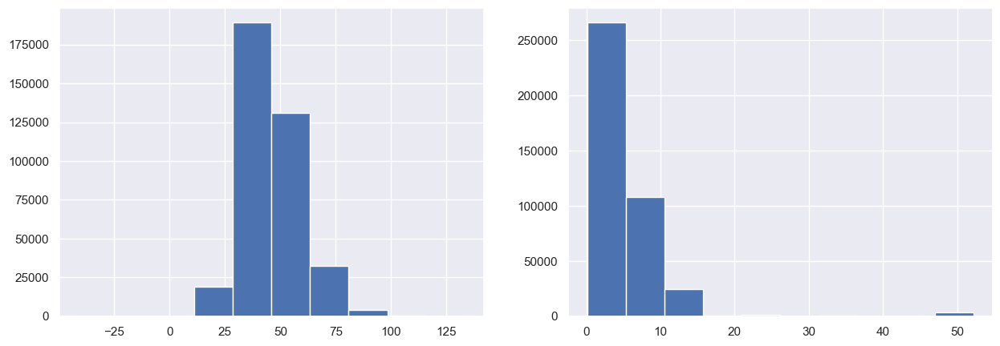

In [26]:
plt.figure(figsize=(15,5))
plt.subplot(1,2,1)
plt.hist(df['CustomerAge'])

plt.subplot(1,2,2)
plt.hist(df['PurchasePrice'])

In [27]:
# Calculate the first and third quartiles (Q1 and Q3)
q1, q3 = df['CustomerAge'].quantile([0.25, 0.75])

# Calculate the IQR
iqr = q3 - q1

# Calculate the lower and upper limits
ll = q1 - 1.5 * iqr
ul = q3 + 1.5 * iqr

# Identify and create separate DataFrames for outliers and non-outliers
dfu = df[df['CustomerAge'] > ul]
dfl = df[df['CustomerAge'] < ll]

# Cap the outliers to the upper and lower limits
df['CustomerAge'] = df['CustomerAge'].apply(lambda x: ul if x > ul else (ll if x < ll else x))


In [28]:
q1,q3,ll,ul

(36.0, 54.0, 9.0, 81.0)

(array([6.6000e+01, 3.3710e+03, 3.0740e+04, 7.8930e+04, 8.5361e+04,
        7.3264e+04, 4.8571e+04, 3.0140e+04, 1.5505e+04, 1.0993e+04]),
 array([ 9. , 16.2, 23.4, 30.6, 37.8, 45. , 52.2, 59.4, 66.6, 73.8, 81. ]),
 <BarContainer object of 10 artists>)

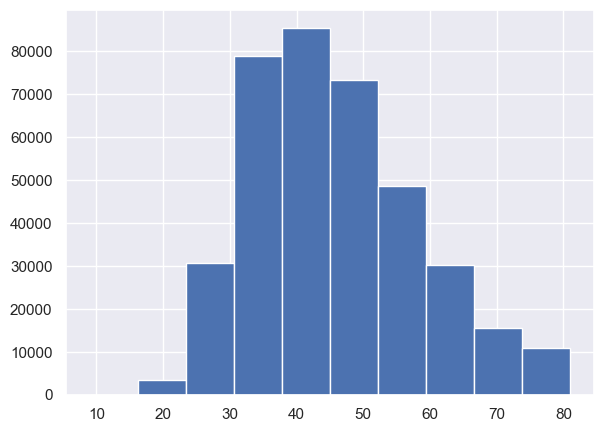

In [29]:
plt.figure(figsize=(15,5))
plt.subplot(1,2,1)
plt.hist(df['CustomerAge'])

In [30]:
# As customer age is continuous will be using mean 
df['CustomerAge'].fillna(df['CustomerAge'].median(),inplace=True)

Filling missing values with the median after dealing with outliers through IQR is a suitable approach for ensuring that the imputed values are not influenced by extreme data points. It's a common practice in data preprocessing and helps maintain the integrity of the data while handling missing values in a way that's robust to outliers.






In [31]:
# Calculate the first and third quartiles (Q1 and Q3)
q1, q3 = df['PurchasePrice'].quantile([0.25, 0.75])

# Calculate the IQR
iqr = q3 - q1

# Calculate the lower and upper limits
ll = q1 - 1.5 * iqr
ul = q3 + 1.5 * iqr

# Identify and create separate DataFrames for outliers and non-outliers
dfu = df[df['PurchasePrice'] > ul]
dfl = df[df['PurchasePrice'] < ll]

# Cap the outliers to the upper and lower limits
df['PurchasePrice'] = df['PurchasePrice'].apply(lambda x: ul if x > ul else (ll if x < ll else x))

In [32]:
# As customer age is continuous will be using mean 
df['PurchasePrice'].fillna(df['PurchasePrice'].median(),inplace=True)

(array([  1165.,  44459., 122839.,  70028.,  55011.,  20027.,  39628.,
          8048.,  15351.,  29867.]),
 array([ 0.19 ,  1.358,  2.526,  3.694,  4.862,  6.03 ,  7.198,  8.366,
         9.534, 10.702, 11.87 ]),
 <BarContainer object of 10 artists>)

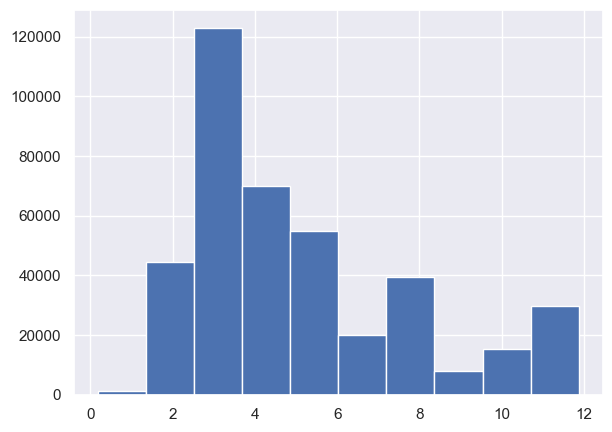

In [33]:
plt.figure(figsize=(15,5))
plt.subplot(1,2,1)
plt.hist(df['PurchasePrice'])

In [34]:
df.head()

,OriginalCreditor[Redacted],CurrentBalance,DebtLoadPrincipal,PurchasePrice,ProductOrDebtType,CollectionStatus,IsStatBarred,ClosureReason,InBankruptcy,AccountInsolvencyType,CustomerInsolvencyType,IsLegal,LastPaymentAmount,LastPaymentMethod,NumLiableParties,CustomerAge,NumPhones,NumEmails,NumAddresses
0,Creditor 1,0.0,1160.20,4.22,Other,PAID_IN_FULL,N,NaN,N,NaN,NaN,Y,10.00,Cheque,1.0,53.0,0,0,1
1,Creditor 2,182.9,182.90,4.22,Other,CANCELLED_WITHDRAWN,Y,NaN,N,NaN,NaN,N,NaN,NaN,1.0,44.0,0,0,1
2,Creditor 1,0.0,538.57,4.22,Other,PAID_IN_FULL,N,NaN,N,NaN,NaN,N,5.37,Cheque,1.0,44.0,1,0,1
3,Creditor 2,8279.5,8279.50,4.22,Other,PASSIVE,Y,NaN,N,NaN,NaN,N,NaN,NaN,1.0,44.0,1,0,1
4,Creditor 1,0.0,523.00,4.22,Other,PAID_IN_FULL,Y,NaN,N,NaN,NaN,Y,5.00,Cheque,1.0,46.0,2,0,1


<AxesSubplot:>

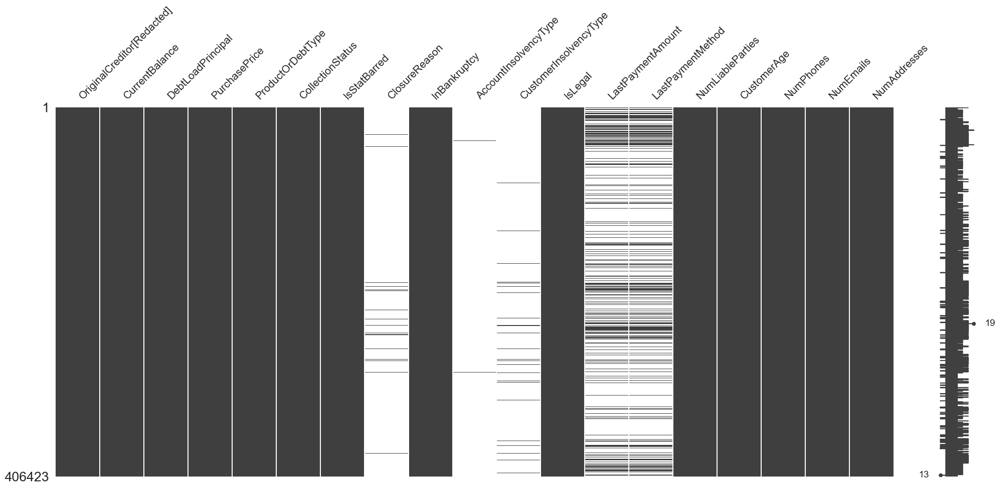

In [35]:
import missingno as msno
msno.matrix(df)


In [36]:
# dropping account solvency type as 99.92% null values
df.drop('AccountInsolvencyType', axis=1,inplace=True)

In [37]:
df['LastPaymentMethod'].unique()

array(['Cheque', nan, 'Automatic Payment', 'Direct Credit', 'Unknown',
       'Cash', 'Direct Debit', 'Credit Card / Debit Card',
       'Direct Transfer ', 'Mastercard'], dtype=object)

In [38]:
# filling null values using fillna function, with mode as categorical data
df['LastPaymentMethod'].fillna(df['LastPaymentMethod'].mode()[0], inplace=True)

<AxesSubplot:xlabel='LastPaymentAmount'>

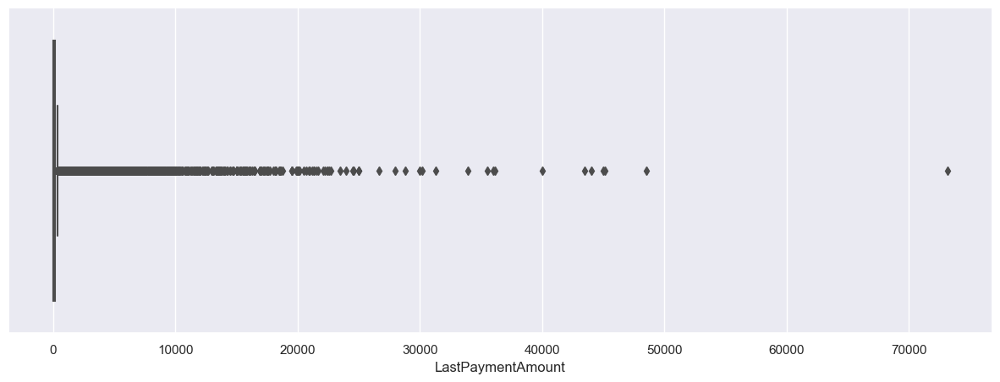

In [39]:
plt.figure(figsize=(15,5))
sns.boxplot(x=df['LastPaymentAmount'])

Last payment amount is imputed using simple imputer and used IQR method for outliers

In [40]:
from sklearn.impute import SimpleImputer

imputer = SimpleImputer(strategy='median')
df['LastPaymentAmount'] = imputer.fit_transform(df[['LastPaymentAmount']])


In [41]:
q1, q3 = df['LastPaymentAmount'].quantile([0.25, 0.75])
iqr = q3 - q1
lower_limit = q1 - 1.5 * iqr
upper_limit = q3 + 1.5 * iqr

# Cap the outliers to the upper limit
df['LastPaymentAmount'] = df['LastPaymentAmount'].apply(lambda x: upper_limit if x > upper_limit else x)


<AxesSubplot:xlabel='LastPaymentAmount'>

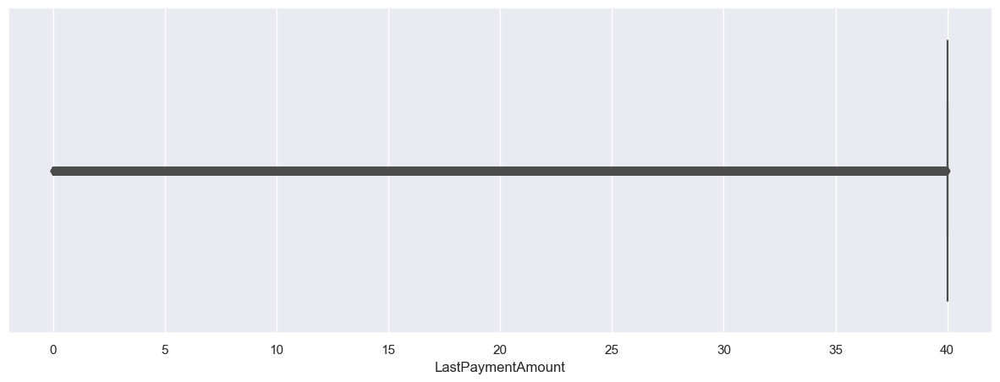

In [42]:
plt.figure(figsize=(15,5))
sns.boxplot(x=df['LastPaymentAmount'])

In [43]:
df['LastPaymentAmount'].unique()

array([10.  , 40.  ,  5.37, ..., 23.22, 20.01,  5.96])

In [44]:
df['LastPaymentAmount'].isnull().sum()

0

In [45]:
df.isnull().sum()

OriginalCreditor[Redacted]         0
CurrentBalance                     0
DebtLoadPrincipal                  0
PurchasePrice                      0
ProductOrDebtType                  0
CollectionStatus                   0
IsStatBarred                       0
ClosureReason                 397393
InBankruptcy                       0
CustomerInsolvencyType        397892
IsLegal                            0
LastPaymentAmount                  0
LastPaymentMethod                  0
NumLiableParties                 122
CustomerAge                        0
NumPhones                          0
NumEmails                          0
NumAddresses                       0
dtype: int64

NumLiableParties also has outliers so used IQR and used fillna 

In [46]:
df['NumLiableParties'].unique()

array([ 1.,  2., nan,  3.,  4.])

(array([3.99494e+05, 0.00000e+00, 0.00000e+00, 6.65200e+03, 0.00000e+00,
        0.00000e+00, 1.51000e+02, 0.00000e+00, 0.00000e+00, 4.00000e+00]),
 array([1. , 1.3, 1.6, 1.9, 2.2, 2.5, 2.8, 3.1, 3.4, 3.7, 4. ]),
 <BarContainer object of 10 artists>)

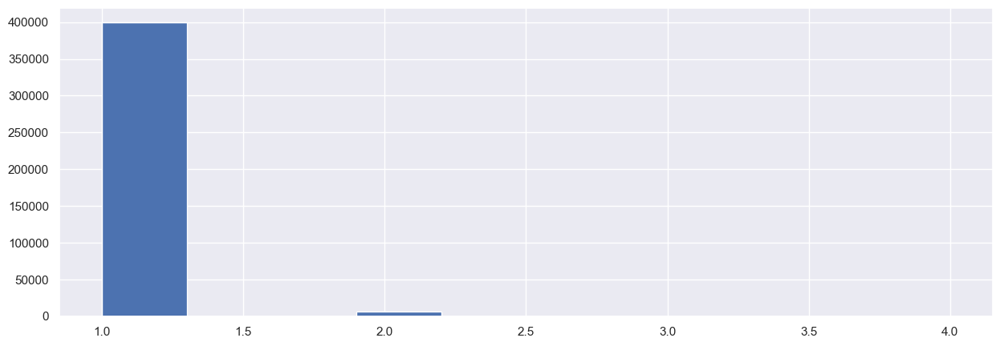

In [47]:
plt.figure(figsize=(15,5))
plt.hist(x=df['NumLiableParties'])

In [48]:
# Calculate the first and third quartiles (Q1 and Q3)
q1, q3 = df['NumLiableParties'].quantile([0.25, 0.75])

# Calculate the IQR
iqr = q3 - q1

# Calculate the lower and upper limits
ll = q1 - 1.5 * iqr
ul = q3 + 1.5 * iqr

# Identify and create separate DataFrames for outliers and non-outliers
dfu = df[df['NumLiableParties']> ul]
dfl = df[df['NumLiableParties'] < ll]

In [49]:
dfl

,OriginalCreditor[Redacted],CurrentBalance,DebtLoadPrincipal,PurchasePrice,ProductOrDebtType,CollectionStatus,IsStatBarred,ClosureReason,InBankruptcy,CustomerInsolvencyType,IsLegal,LastPaymentAmount,LastPaymentMethod,NumLiableParties,CustomerAge,NumPhones,NumEmails,NumAddresses


In [50]:
dfu

,OriginalCreditor[Redacted],CurrentBalance,DebtLoadPrincipal,PurchasePrice,ProductOrDebtType,CollectionStatus,IsStatBarred,ClosureReason,InBankruptcy,CustomerInsolvencyType,IsLegal,LastPaymentAmount,LastPaymentMethod,NumLiableParties,CustomerAge,NumPhones,NumEmails,NumAddresses
17,Creditor 3,0.00,4979.40,4.22,Other,PAID_IN_FULL,N,NaN,N,NaN,N,40.00,Cheque,2.0,59.0,0,0,2
84,Creditor 3,0.00,6650.42,4.22,Other,PAID_IN_FULL,N,NaN,N,NaN,Y,36.59,Cheque,2.0,51.0,1,1,2
147,Creditor 3,19700.46,19395.17,4.22,Other,CLOSED,Y,Statute Barred,N,NaN,Y,10.00,Cheque,2.0,66.0,0,0,2
218,Creditor 6,3410.67,7450.67,4.22,Other,PASSIVE,Y,NaN,N,NaN,N,30.00,Cheque,2.0,44.0,1,0,2
17950,Creditor 8,0.00,1214.67,4.22,Other,PAID_IN_FULL,N,NaN,N,NaN,N,20.00,Cheque,2.0,44.0,3,0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
406317,Creditor 50,9797.98,9797.98,7.38,Finance Company - Other,ACTIVE,N,NaN,N,NaN,N,40.00,Cheque,2.0,44.0,1,1,1
406318,Creditor 50,15369.09,15369.09,7.38,Finance Company - Other,ACTIVE,N,NaN,N,NaN,N,40.00,Cheque,2.0,44.0,1,1,1
406319,Creditor 50,2373.69,2373.69,7.38,Finance Company - Other,PENDING,N,NaN,N,NaN,N,40.00,Cheque,2.0,44.0,1,1,0
406341,Creditor 50,646.35,646.35,7.38,Finance Company - Other,ACTIVE,N,NaN,N,NaN,N,40.00,Cheque,2.0,24.0,1,2,1


In [51]:
# It has values above upper limit only

In [52]:
# Cap the outliers to the upper limit
df['NumLiableParties'] = df['NumLiableParties'].apply(lambda x: ul if x > ul else x)

(array([     0.,      0.,      0.,      0.,      0., 406301.,      0.,
             0.,      0.,      0.]),
 array([0.5, 0.6, 0.7, 0.8, 0.9, 1. , 1.1, 1.2, 1.3, 1.4, 1.5]),
 <BarContainer object of 10 artists>)

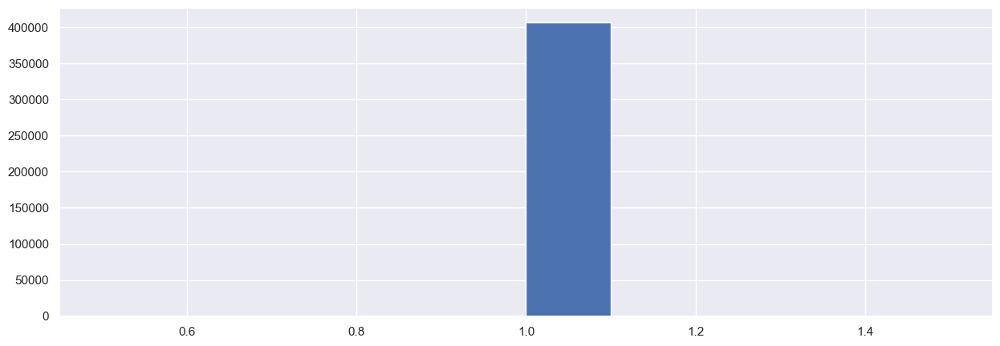

In [53]:
plt.figure(figsize=(15,5))
plt.hist(x=df['NumLiableParties'])

In [54]:
df['NumLiableParties'].fillna(df['NumLiableParties'].median(), inplace=True)

In [55]:
df['ClosureReason'].value_counts()

Insolvent                          5634
Statute Barred                     1777
Other Reason - Please see notes     650
Deceased                            405
Small Balance                       166
Duplicate Debt                      107
Uneconomical to pursue              105
Fraud                                96
Company Struck Off                   37
Client Instructions                  32
Sensitive Issue                      14
Paid                                  4
Incarcerated                          2
Disputes/Legal Case Lost              1
Name: ClosureReason, dtype: int64

In [56]:
df['ClosureReason'].fillna('Unknown', inplace=True)


In [57]:
df['ClosureReason'].value_counts()

Unknown                            397393
Insolvent                            5634
Statute Barred                       1777
Other Reason - Please see notes       650
Deceased                              405
Small Balance                         166
Duplicate Debt                        107
Uneconomical to pursue                105
Fraud                                  96
Company Struck Off                     37
Client Instructions                    32
Sensitive Issue                        14
Paid                                    4
Incarcerated                            2
Disputes/Legal Case Lost                1
Name: ClosureReason, dtype: int64

In [58]:
df['CustomerInsolvencyType'].unique()

array([nan, 'BANKRUPT', 'NO_ASSET_PROCEDURE', 'STRUCK_OFF',
       'APPLICATION_FOR_LIQUIDATION', 'LIQUIDATION',
       'BANKRUPT | NO_ASSET_PROCEDURE', 'RECEIVERSHIP',
       'BANKRUPT | LIQUIDATION', 'BANKRUPT | STRUCK_OFF',
       'APPLICATION_FOR_LIQUIDATION | RECEIVERSHIP',
       'LIQUIDATION | STRUCK_OFF',
       'APPLICATION_FOR_LIQUIDATION | STRUCK_OFF',
       'LIQUIDATION | RECEIVERSHIP'], dtype=object)

In [59]:
df['CustomerInsolvencyType'].value_counts()

BANKRUPT                                      3809
NO_ASSET_PROCEDURE                            3154
STRUCK_OFF                                    1009
LIQUIDATION                                    410
BANKRUPT | NO_ASSET_PROCEDURE                   59
APPLICATION_FOR_LIQUIDATION                     28
LIQUIDATION | STRUCK_OFF                        17
RECEIVERSHIP                                    15
BANKRUPT | LIQUIDATION                          13
LIQUIDATION | RECEIVERSHIP                       9
BANKRUPT | STRUCK_OFF                            5
APPLICATION_FOR_LIQUIDATION | STRUCK_OFF         2
APPLICATION_FOR_LIQUIDATION | RECEIVERSHIP       1
Name: CustomerInsolvencyType, dtype: int64

In [60]:
df['CustomerInsolvencyType'].isnull().sum()

397892

In [61]:
df['CustomerInsolvencyType'].fillna('Unknown', inplace=True)
# used fill na for null values

In [62]:
df.columns

Index(['OriginalCreditor[Redacted]', 'CurrentBalance', 'DebtLoadPrincipal',
       'PurchasePrice', 'ProductOrDebtType', 'CollectionStatus',
       'IsStatBarred', 'ClosureReason', 'InBankruptcy',
       'CustomerInsolvencyType', 'IsLegal', 'LastPaymentAmount',
       'LastPaymentMethod', 'NumLiableParties', 'CustomerAge', 'NumPhones',
       'NumEmails', 'NumAddresses'],
      dtype='object')

In [63]:
df['CustomerInsolvencyType'].value_counts()

Unknown                                       397892
BANKRUPT                                        3809
NO_ASSET_PROCEDURE                              3154
STRUCK_OFF                                      1009
LIQUIDATION                                      410
BANKRUPT | NO_ASSET_PROCEDURE                     59
APPLICATION_FOR_LIQUIDATION                       28
LIQUIDATION | STRUCK_OFF                          17
RECEIVERSHIP                                      15
BANKRUPT | LIQUIDATION                            13
LIQUIDATION | RECEIVERSHIP                         9
BANKRUPT | STRUCK_OFF                              5
APPLICATION_FOR_LIQUIDATION | STRUCK_OFF           2
APPLICATION_FOR_LIQUIDATION | RECEIVERSHIP         1
Name: CustomerInsolvencyType, dtype: int64

<AxesSubplot:>

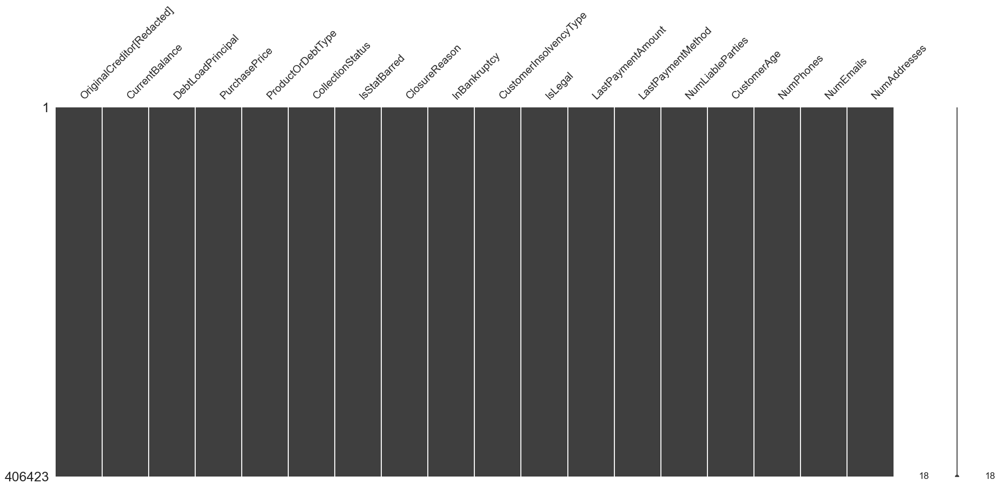

In [64]:
import missingno as msno
msno.matrix(df)

Finally, we set all null values and outliers. Now we encounter values with max contributor for differnt features so we'll handling that now by marking 0 to oothers whihc are not important and 1,2,3, etc to values whihc are importnat in a feature

In [65]:
df.head(20)

,OriginalCreditor[Redacted],CurrentBalance,DebtLoadPrincipal,PurchasePrice,ProductOrDebtType,CollectionStatus,IsStatBarred,ClosureReason,InBankruptcy,CustomerInsolvencyType,IsLegal,LastPaymentAmount,LastPaymentMethod,NumLiableParties,CustomerAge,NumPhones,NumEmails,NumAddresses
0,Creditor 1,0.00,1160.20,4.22,Other,PAID_IN_FULL,N,Unknown,N,Unknown,Y,10.00,Cheque,1.0,53.0,0,0,1
1,Creditor 2,182.90,182.90,4.22,Other,CANCELLED_WITHDRAWN,Y,Unknown,N,Unknown,N,40.00,Cheque,1.0,44.0,0,0,1
2,Creditor 1,0.00,538.57,4.22,Other,PAID_IN_FULL,N,Unknown,N,Unknown,N,5.37,Cheque,1.0,44.0,1,0,1
3,Creditor 2,8279.50,8279.50,4.22,Other,PASSIVE,Y,Unknown,N,Unknown,N,40.00,Cheque,1.0,44.0,1,0,1
4,Creditor 1,0.00,523.00,4.22,Other,PAID_IN_FULL,Y,Unknown,N,Unknown,Y,5.00,Cheque,1.0,46.0,2,0,1
5,Creditor 1,1118.74,790.30,4.22,Other,PASSIVE,Y,Unknown,N,Unknown,Y,10.00,Cheque,1.0,44.0,0,0,1
6,Creditor 1,0.00,71.89,4.22,Other,PAID_IN_FULL,N,Unknown,N,Unknown,Y,40.00,Cheque,1.0,50.0,2,0,1
7,Creditor 2,0.00,11091.35,4.22,Other,PAID_IN_FULL,N,Unknown,N,Unknown,Y,40.00,Cheque,1.0,44.0,1,0,1
8,Creditor 1,481.34,404.67,4.22,Other,CLOSED,Y,Insolvent,N,Unknown,N,20.00,Cheque,1.0,44.0,1,0,0
9,Creditor 1,0.00,903.76,4.22,Other,PAID_IN_FULL,N,Unknown,N,Unknown,Y,8.26,Cheque,1.0,46.0,1,0,1


In [66]:
# Assuming df is your DataFrame
df.rename(columns={'OriginalCreditor[Redacted]': 'Creditor'}, inplace=True)

In [67]:
# Create a new feature for the top 7 creditors, marking them with 1 or 0
top_creditors = ['Creditor 17','Creditor 33','Creditor 47','Creditor 48','Creditor 7']
df['IsTopCreditor'] = df['Creditor'].apply(lambda x: 1 if x in top_creditors else 0)


Here as we have 52 unique contributor, so marked 1 to main contributor and 0 to remaining

In [68]:
df.drop('Creditor', axis=1, inplace=True)


In [69]:
df.head()

,CurrentBalance,DebtLoadPrincipal,PurchasePrice,ProductOrDebtType,CollectionStatus,IsStatBarred,ClosureReason,InBankruptcy,CustomerInsolvencyType,IsLegal,LastPaymentAmount,LastPaymentMethod,NumLiableParties,CustomerAge,NumPhones,NumEmails,NumAddresses,IsTopCreditor
0,0.0,1160.20,4.22,Other,PAID_IN_FULL,N,Unknown,N,Unknown,Y,10.00,Cheque,1.0,53.0,0,0,1,0
1,182.9,182.90,4.22,Other,CANCELLED_WITHDRAWN,Y,Unknown,N,Unknown,N,40.00,Cheque,1.0,44.0,0,0,1,0
2,0.0,538.57,4.22,Other,PAID_IN_FULL,N,Unknown,N,Unknown,N,5.37,Cheque,1.0,44.0,1,0,1,0
3,8279.5,8279.50,4.22,Other,PASSIVE,Y,Unknown,N,Unknown,N,40.00,Cheque,1.0,44.0,1,0,1,0
4,0.0,523.00,4.22,Other,PAID_IN_FULL,Y,Unknown,N,Unknown,Y,5.00,Cheque,1.0,46.0,2,0,1,0


In [70]:
# around 65000 debtors has paid the entire outstanding debt amount
# 5000 accounts are no longer pursued for collecton
# 138000 accounts is in a passive state, indicating that no active collection efforts are currently taking place.
# 170000  account is actively being pursued for debt collection. Collection efforts are ongoing.
# 15000 accounts are closed i.e. collection process for this account has been closed, often indicating that the account is no longer active in the collection pipeline.
# against 1000 approx account legal action were taken
# 5-8000 are under UNDER_ARRANGEMENT and SETTLED FOR LESS

<AxesSubplot:xlabel='IsStatBarred', ylabel='count'>

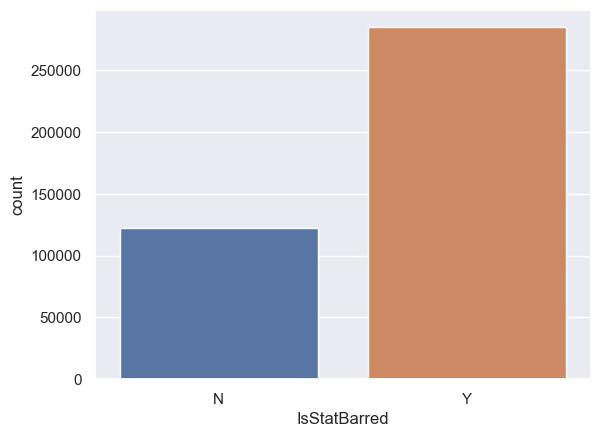

In [71]:
sns.countplot(x='IsStatBarred',data=df)

"IsStatBarred" variable is marked as "Yes," it indicates that the statute of limitations (SOL) for pursuing legal action to collect a debt has expired.
That is There are 300000 debtors against which legal action cnt be taken.for these accounts, They may focus on negotiation, settlement, or other non-legal means of debt recovery.
Some jurisdictions restrict or prohibit reporting statute-barred debts on the debtor's credit report.
Debtors have legal rights and protections against aggressive or unfair collection practices, even for statute-barred debts.
we can see tenure when this accounts isstats barred is yes 
we can see relation with other fields

In [72]:
# 5000 accounts were declared insolvent i.e. they are unable to meet their financial obligations and have insufficient assets to cover their debts,
# 1500 accounts were marked statute barred i.e.  legal action to collect the debt has expired, and it is no longer legally collectible through the courts


# converting categorical variable

In [73]:
df['ProductOrDebtType'].unique()

array(['Other', 'Personal Loans', 'Utilities/Telco - Other',
       'Finance Company - Other', 'Loans', 'Credit Cards', 'Store Cards',
       'Bank - Other', 'Hire Purchase', 'Residential Electricity'],
      dtype=object)

In [74]:
df['ProductOrDebtType'].value_counts()

Utilities/Telco - Other    212158
Other                       84218
Finance Company - Other     48695
Store Cards                 17699
Credit Cards                16891
Bank - Other                13030
Residential Electricity      7693
Personal Loans               4309
Loans                        1260
Hire Purchase                 470
Name: ProductOrDebtType, dtype: int64

In [75]:
# We have added less impactful values to others list
others=['Bank - Other','Residential Electricity','Personal Loans','Loans','Hire Purchase']
condition=df['ProductOrDebtType'].isin(others)
df['ProductOrDebtType']=df['ProductOrDebtType'].replace({'Utilities/Telco - Other':1,'Other':2,'Finance Company - Other':5,'Store Cards':3,'Credit Cards':4})
df['ProductOrDebtType'] = df['ProductOrDebtType'].replace(others, 0)

In [76]:
df.head()

,CurrentBalance,DebtLoadPrincipal,PurchasePrice,ProductOrDebtType,CollectionStatus,IsStatBarred,ClosureReason,InBankruptcy,CustomerInsolvencyType,IsLegal,LastPaymentAmount,LastPaymentMethod,NumLiableParties,CustomerAge,NumPhones,NumEmails,NumAddresses,IsTopCreditor
0,0.0,1160.20,4.22,2,PAID_IN_FULL,N,Unknown,N,Unknown,Y,10.00,Cheque,1.0,53.0,0,0,1,0
1,182.9,182.90,4.22,2,CANCELLED_WITHDRAWN,Y,Unknown,N,Unknown,N,40.00,Cheque,1.0,44.0,0,0,1,0
2,0.0,538.57,4.22,2,PAID_IN_FULL,N,Unknown,N,Unknown,N,5.37,Cheque,1.0,44.0,1,0,1,0
3,8279.5,8279.50,4.22,2,PASSIVE,Y,Unknown,N,Unknown,N,40.00,Cheque,1.0,44.0,1,0,1,0
4,0.0,523.00,4.22,2,PAID_IN_FULL,Y,Unknown,N,Unknown,Y,5.00,Cheque,1.0,46.0,2,0,1,0


In [77]:
df['ProductOrDebtType'].unique()

array([2, 0, 1, 5, 4, 3], dtype=int64)

In [78]:
# collectionStatus
df['CollectionStatus'].unique()

array(['PAID_IN_FULL', 'CANCELLED_WITHDRAWN', 'PASSIVE', 'CLOSED',
       'ACTIVE', 'SETTLED FOR LESS', 'UNDER_ARRANGEMENT', 'LEGAL',
       'LEGAL_ARRANGEMENT', 'NON_COLLECTION', 'HOLDING', 'PENDING'],
      dtype=object)

In [79]:

others=['CANCELLED_WITHDRAWN', 'SETTLED FOR LESS', 'UNDER_ARRANGEMENT', 'LEGAL',
       'LEGAL_ARRANGEMENT', 'NON_COLLECTION', 'HOLDING', 'PENDING']
condition=df['CollectionStatus'].isin(others)
df['CollectionStatus']=df['CollectionStatus'].replace({'ACTIVE':1,'PASSIVE':2,'PAID_IN_FULL':3,'CLOSED':3})
df['CollectionStatus'] = df['CollectionStatus'].replace(others, 0)

In [80]:

df['CollectionStatus'].unique()

array([3, 0, 2, 1], dtype=int64)

In [81]:
df.head()

,CurrentBalance,DebtLoadPrincipal,PurchasePrice,ProductOrDebtType,CollectionStatus,IsStatBarred,ClosureReason,InBankruptcy,CustomerInsolvencyType,IsLegal,LastPaymentAmount,LastPaymentMethod,NumLiableParties,CustomerAge,NumPhones,NumEmails,NumAddresses,IsTopCreditor
0,0.0,1160.20,4.22,2,3,N,Unknown,N,Unknown,Y,10.00,Cheque,1.0,53.0,0,0,1,0
1,182.9,182.90,4.22,2,0,Y,Unknown,N,Unknown,N,40.00,Cheque,1.0,44.0,0,0,1,0
2,0.0,538.57,4.22,2,3,N,Unknown,N,Unknown,N,5.37,Cheque,1.0,44.0,1,0,1,0
3,8279.5,8279.50,4.22,2,2,Y,Unknown,N,Unknown,N,40.00,Cheque,1.0,44.0,1,0,1,0
4,0.0,523.00,4.22,2,3,Y,Unknown,N,Unknown,Y,5.00,Cheque,1.0,46.0,2,0,1,0


In [82]:

lst=['IsStatBarred','InBankruptcy','IsLegal',]
for i in lst:
    df[i] = df[i].replace({'Y':1, "N":0}).astype('float')

In [83]:
df.head()

,CurrentBalance,DebtLoadPrincipal,PurchasePrice,ProductOrDebtType,CollectionStatus,IsStatBarred,ClosureReason,InBankruptcy,CustomerInsolvencyType,IsLegal,LastPaymentAmount,LastPaymentMethod,NumLiableParties,CustomerAge,NumPhones,NumEmails,NumAddresses,IsTopCreditor
0,0.0,1160.20,4.22,2,3,0.0,Unknown,0.0,Unknown,1.0,10.00,Cheque,1.0,53.0,0,0,1,0
1,182.9,182.90,4.22,2,0,1.0,Unknown,0.0,Unknown,0.0,40.00,Cheque,1.0,44.0,0,0,1,0
2,0.0,538.57,4.22,2,3,0.0,Unknown,0.0,Unknown,0.0,5.37,Cheque,1.0,44.0,1,0,1,0
3,8279.5,8279.50,4.22,2,2,1.0,Unknown,0.0,Unknown,0.0,40.00,Cheque,1.0,44.0,1,0,1,0
4,0.0,523.00,4.22,2,3,1.0,Unknown,0.0,Unknown,1.0,5.00,Cheque,1.0,46.0,2,0,1,0


In [84]:

df['ClosureReason'].value_counts()

Unknown                            397393
Insolvent                            5634
Statute Barred                       1777
Other Reason - Please see notes       650
Deceased                              405
Small Balance                         166
Duplicate Debt                        107
Uneconomical to pursue                105
Fraud                                  96
Company Struck Off                     37
Client Instructions                    32
Sensitive Issue                        14
Paid                                    4
Incarcerated                            2
Disputes/Legal Case Lost                1
Name: ClosureReason, dtype: int64

In [85]:

others=['Uneconomical to pursue',
       'Small Balance', 'Other Reason - Please see notes', 'Deceased',
       'Client Instructions', 'Company Struck Off', 'Fraud',
       'Sensitive Issue', 'Incarcerated', 'Paid', 'Duplicate Debt',
       'Disputes/Legal Case Lost']
condition=df['ClosureReason'].isin(others)
df['ClosureReason']=df['ClosureReason'].replace({'Insolvent':1,'Statute Barred':2,'Unknown':3})
df['ClosureReason'] = df['ClosureReason'].replace(others, 0)

In [86]:

df['ClosureReason'].unique()

array([3, 1, 2, 0], dtype=int64)

In [87]:
df['CustomerInsolvencyType'].unique()

array(['Unknown', 'BANKRUPT', 'NO_ASSET_PROCEDURE', 'STRUCK_OFF',
       'APPLICATION_FOR_LIQUIDATION', 'LIQUIDATION',
       'BANKRUPT | NO_ASSET_PROCEDURE', 'RECEIVERSHIP',
       'BANKRUPT | LIQUIDATION', 'BANKRUPT | STRUCK_OFF',
       'APPLICATION_FOR_LIQUIDATION | RECEIVERSHIP',
       'LIQUIDATION | STRUCK_OFF',
       'APPLICATION_FOR_LIQUIDATION | STRUCK_OFF',
       'LIQUIDATION | RECEIVERSHIP'], dtype=object)

In [88]:
df['CustomerInsolvencyType'].value_counts()

Unknown                                       397892
BANKRUPT                                        3809
NO_ASSET_PROCEDURE                              3154
STRUCK_OFF                                      1009
LIQUIDATION                                      410
BANKRUPT | NO_ASSET_PROCEDURE                     59
APPLICATION_FOR_LIQUIDATION                       28
LIQUIDATION | STRUCK_OFF                          17
RECEIVERSHIP                                      15
BANKRUPT | LIQUIDATION                            13
LIQUIDATION | RECEIVERSHIP                         9
BANKRUPT | STRUCK_OFF                              5
APPLICATION_FOR_LIQUIDATION | STRUCK_OFF           2
APPLICATION_FOR_LIQUIDATION | RECEIVERSHIP         1
Name: CustomerInsolvencyType, dtype: int64

In [89]:

others=['missing_value','STRUCK_OFF',
       'APPLICATION_FOR_LIQUIDATION', 'LIQUIDATION',
       'BANKRUPT | NO_ASSET_PROCEDURE', 'RECEIVERSHIP',
       'BANKRUPT | LIQUIDATION', 'BANKRUPT | STRUCK_OFF',
       'APPLICATION_FOR_LIQUIDATION | RECEIVERSHIP',
       'LIQUIDATION | STRUCK_OFF',
       'APPLICATION_FOR_LIQUIDATION | STRUCK_OFF',
       'LIQUIDATION | RECEIVERSHIP']
condition=df['CustomerInsolvencyType'].isin(others)
df['CustomerInsolvencyType']=df['CustomerInsolvencyType'].replace({'Unknown':3,'BANKRUPT':1,'NO_ASSET_PROCEDURE':2})
df['CustomerInsolvencyType'] = df['CustomerInsolvencyType'].replace(others, 0)

In [90]:
df['CustomerInsolvencyType'].unique()

array([3, 1, 2, 0], dtype=int64)

In [91]:
df.head()

,CurrentBalance,DebtLoadPrincipal,PurchasePrice,ProductOrDebtType,CollectionStatus,IsStatBarred,ClosureReason,InBankruptcy,CustomerInsolvencyType,IsLegal,LastPaymentAmount,LastPaymentMethod,NumLiableParties,CustomerAge,NumPhones,NumEmails,NumAddresses,IsTopCreditor
0,0.0,1160.20,4.22,2,3,0.0,3,0.0,3,1.0,10.00,Cheque,1.0,53.0,0,0,1,0
1,182.9,182.90,4.22,2,0,1.0,3,0.0,3,0.0,40.00,Cheque,1.0,44.0,0,0,1,0
2,0.0,538.57,4.22,2,3,0.0,3,0.0,3,0.0,5.37,Cheque,1.0,44.0,1,0,1,0
3,8279.5,8279.50,4.22,2,2,1.0,3,0.0,3,0.0,40.00,Cheque,1.0,44.0,1,0,1,0
4,0.0,523.00,4.22,2,3,1.0,3,0.0,3,1.0,5.00,Cheque,1.0,46.0,2,0,1,0


In [92]:

df['LastPaymentMethod'].unique()

array(['Cheque', 'Automatic Payment', 'Direct Credit', 'Unknown', 'Cash',
       'Direct Debit', 'Credit Card / Debit Card', 'Direct Transfer ',
       'Mastercard'], dtype=object)

In [93]:

df['LastPaymentMethod'].value_counts()

Cheque                      356600
Automatic Payment            27339
Direct Credit                 8798
Direct Debit                  5465
Unknown                       3702
Cash                          3359
Credit Card / Debit Card      1122
Direct Transfer                 31
Mastercard                       7
Name: LastPaymentMethod, dtype: int64

In [94]:

others=['Unknown', 'Cash', 'Credit Card / Debit Card', 'Direct Transfer ',
       'Mastercard']
condition=df['LastPaymentMethod'].isin(others)
df['LastPaymentMethod']=df['LastPaymentMethod'].replace({'Cheque':1,'Automatic Payment':2,'Direct Credit':3,'Direct Debit':4})
df['LastPaymentMethod'] = df['LastPaymentMethod'].replace(others, 0)

In [95]:
from imblearn.over_sampling import SMOTE
df["IsLegal"] = SMOTE(random_state=42).fit_resample(df[["IsLegal"]], df["IsLegal"])[0]


In [96]:
df.head()

,CurrentBalance,DebtLoadPrincipal,PurchasePrice,ProductOrDebtType,CollectionStatus,IsStatBarred,ClosureReason,InBankruptcy,CustomerInsolvencyType,IsLegal,LastPaymentAmount,LastPaymentMethod,NumLiableParties,CustomerAge,NumPhones,NumEmails,NumAddresses,IsTopCreditor
0,0.0,1160.20,4.22,2,3,0.0,3,0.0,3,1.0,10.00,1,1.0,53.0,0,0,1,0
1,182.9,182.90,4.22,2,0,1.0,3,0.0,3,0.0,40.00,1,1.0,44.0,0,0,1,0
2,0.0,538.57,4.22,2,3,0.0,3,0.0,3,0.0,5.37,1,1.0,44.0,1,0,1,0
3,8279.5,8279.50,4.22,2,2,1.0,3,0.0,3,0.0,40.00,1,1.0,44.0,1,0,1,0
4,0.0,523.00,4.22,2,3,1.0,3,0.0,3,1.0,5.00,1,1.0,46.0,2,0,1,0


In [97]:
df['IsTopCreditor'].dtype

dtype('int64')

In [98]:
pip install xgboost


In [99]:
import xgboost as xgb
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score


# Separate the target variable and features
X = df.drop('IsStatBarred', axis=1)
y = df['IsStatBarred']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42,stratify=y)


 If the class imbalance in target variable is very significant and stratify=y alone doesn't provide satisfactory results, we'll consider using SMOTE to oversample the minority class.So, we'll check the performance of our machine learning model both with and without SMOTE. If we find that your model is not performing well on the minority class even with stratified sampling, we might benefit from SMOTE.

In [100]:
# Create an XGBoost classifier
xgb_model = xgb.XGBClassifier()

# Fit the model to the training data
xgb_model.fit(X_train, y_train)


XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=None, n_jobs=None,
              num_parallel_tree=None, random_state=None, ...)

In [101]:
# Make predictions on the test data
y_pred = xgb_model.predict(X_test)

# Calculate accuracy
accuracy = accuracy_score(y_test, y_pred)
print(f'Accuracy: {accuracy * 100:.2f}%')


Accuracy: 97.89%


In [102]:
from sklearn.metrics import confusion_matrix

# Create the confusion matrix
cm = confusion_matrix(y_test, y_pred)
print("Confusion Matrix:")
print(cm)


Confusion Matrix:
[[35473  1090]
 [ 1484 83880]]


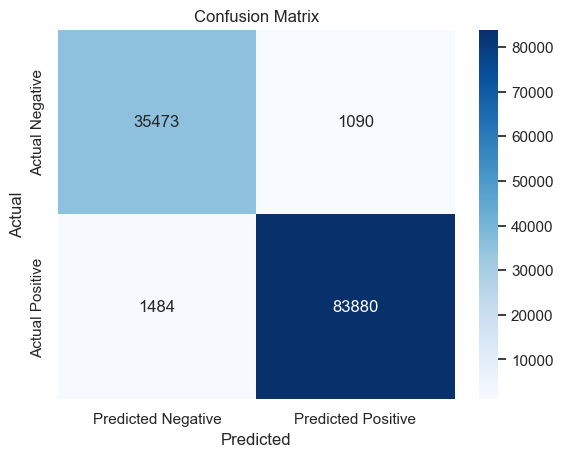

In [103]:
import seaborn as sns
import matplotlib.pyplot as plt

# Create a heatmap of the confusion matrix
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['Predicted Negative', 'Predicted Positive'], yticklabels=['Actual Negative', 'Actual Positive'])
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix")
plt.show()


True Positives (TP): 83,880
True Negatives (TN): 35,473
False Positives (FP): 1090
False Negatives (FN): 1484

We have a large number of true positives and true negatives, which suggests that our model is making accurate predictions. The relatively small number of false positives and false negatives indicates that the model's errors are relatively low.

In [104]:
from sklearn.metrics import classification_report

report = classification_report(y_test, y_pred)
print(report)

              precision    recall  f1-score   support

         0.0       0.96      0.97      0.96     36563
         1.0       0.99      0.98      0.98     85364

    accuracy                           0.98    121927
   macro avg       0.97      0.98      0.97    121927
weighted avg       0.98      0.98      0.98    121927



Classification Report Summary

The classification report provides a comprehensive assessment of our model's performance in a binary classification task. The two classes under consideration are Class 0.0 (negative class) and Class 1.0 (positive class).

Class 0.0:

Precision (Accuracy of Negative Predictions): A high precision of 0.97 indicates that our model correctly predicts Class 0.0 in 97% of cases, minimizing false positives.

Recall (Sensitivity): A recall of 0.98 means our model captures 98% of all actual Class 0.0 instances, demonstrating its effectiveness in identifying true negatives.

F1-Score (Balance of Precision and Recall): With an F1-score of 0.97, our model maintains a robust balance between precision and recall for Class 0.0.

Class 1.0:

Precision (Accuracy of Positive Predictions): The impressive precision score of 0.99 shows that our model correctly predicts Class 1.0 in 99% of instances, limiting false positives.

Recall (Sensitivity): A recall of 0.99 indicates that our model successfully captures 99% of all actual Class 1.0 instances, illustrating its strength in identifying true positives.

F1-Score (Balance of Precision and Recall): The remarkable F1-score of 0.99 underlines the excellent balance between precision and recall for Class 1.0.

Overall Model Performance:

Accuracy (Overall Correctness): Our model exhibits an impressive overall accuracy of 98%, which means it correctly predicts both classes in 98% of instances.
Summary:
In summary, our model demonstrates exceptional performance in accurately predicting both positive and negative classes. It strikes a harmonious balance between precision and recall, leading to high F1-scores for both classes. The overall model accuracy of 98% attests to its competence in handling the binary classification task.

Using RandomForest

In [105]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, classification_report


In [106]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)


In [107]:
rf_model = RandomForestClassifier(n_estimators=100, random_state=42)
rf_model.fit(X_train, y_train)


RandomForestClassifier(random_state=42)

In [108]:
y_pred = rf_model.predict(X_test)


In [109]:
accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy: {accuracy:.2f}")


Accuracy: 0.98


In [110]:
from sklearn.model_selection import cross_val_score
# Perform 5-fold cross-validation
scores = cross_val_score(rf_model, X, y, cv=5, scoring='accuracy')

# Print the cross-validated accuracy scores
print("Cross-validated accuracy scores:", scores)
print(scores.mean())

Cross-validated accuracy scores: [0.99308606 0.91446146 0.47164914 0.65742336 0.77627823]
0.762579648647572


XGboost performed well compare to Random forest

Let's check the important features

                   Feature  Importance
16           IsTopCreditor    0.214010
4         CollectionStatus    0.189074
0           CurrentBalance    0.176039
3        ProductOrDebtType    0.134371
14               NumEmails    0.099902
5            ClosureReason    0.057192
10       LastPaymentMethod    0.054096
2            PurchasePrice    0.021371
13               NumPhones    0.014852
8                  IsLegal    0.013529
7   CustomerInsolvencyType    0.006662
15            NumAddresses    0.005828
9        LastPaymentAmount    0.004601
1        DebtLoadPrincipal    0.003124
6             InBankruptcy    0.003066
12             CustomerAge    0.002285
11        NumLiableParties    0.000000


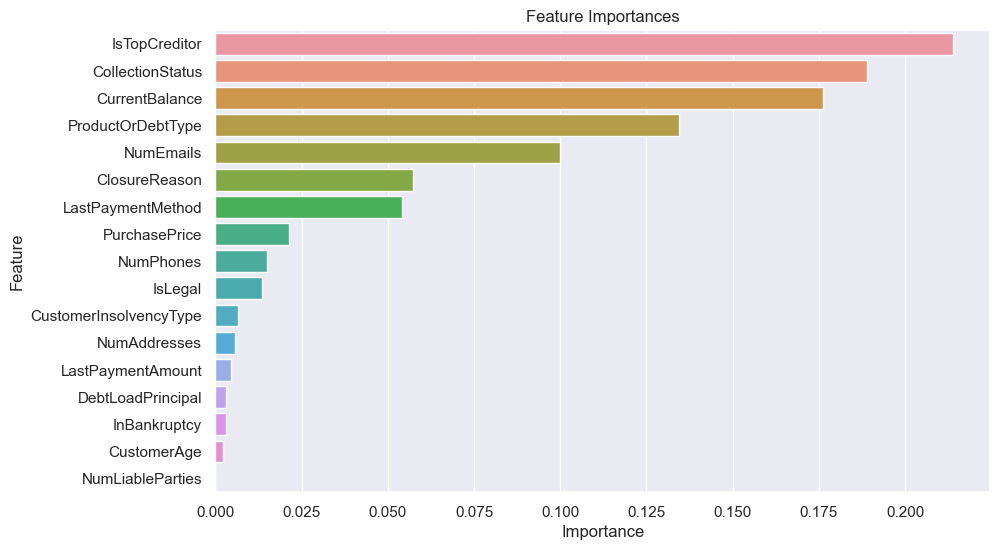

In [111]:

# Get feature importances
feature_importance = xgb_model.feature_importances_

# Create a DataFrame to associate feature names with their importances
feature_importance_df = pd.DataFrame({'Feature': X_train.columns, 'Importance': feature_importance})

# Sort the features by importance in descending order
feature_importance_df = feature_importance_df.sort_values(by='Importance', ascending=False)

# Print or visualize the feature importances
print(feature_importance_df)

# You can also plot a bar chart to visualize the feature importances
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(10, 6))
sns.barplot(x='Importance', y='Feature', data=feature_importance_df)
plt.title('Feature Importances')
plt.show()


Top 5 feature: IsTopCreditor(Creditor), Collection status, Current balance, Product or debt type, Number of emails

In [112]:
# Except closure reason none of the feature whihc were havng high missing values is impacting isstatbarred. Now lets remove all the data with more then 75% null values

In [113]:

# Separate the target variable and features
x = df.drop(['IsStatBarred','ClosureReason','CustomerInsolvencyType'], axis=1)
y = df['IsStatBarred']

In [114]:
X_train, X_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=42, stratify=y)


In [115]:
# Create an XGBoost classifier
xgb_model = xgb.XGBClassifier()

# Train the model on the resampled data
xgb_model.fit(X_train,y_train)


XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=None, n_jobs=None,
              num_parallel_tree=None, random_state=None, ...)

In [116]:
from sklearn.metrics import classification_report, roc_auc_score

# Make predictions on the test set
y_pred = xgb_model.predict(X_test)

# Compute precision, recall, F1-score, and AUC-ROC
print("Classification Report:\n", classification_report(y_test, y_pred))
print("AUC-ROC Score:", roc_auc_score(y_test, y_pred))

Classification Report:
               precision    recall  f1-score   support

         0.0       0.96      0.97      0.96     24375
         1.0       0.99      0.98      0.98     56910

    accuracy                           0.98     81285
   macro avg       0.97      0.98      0.97     81285
weighted avg       0.98      0.98      0.98     81285

AUC-ROC Score: 0.9753813551761891


              Feature  Importance
14      IsTopCreditor    0.244592
0      CurrentBalance    0.212178
3   ProductOrDebtType    0.148210
12          NumEmails    0.132588
4    CollectionStatus    0.124452
8   LastPaymentMethod    0.055920
6             IsLegal    0.024675
2       PurchasePrice    0.023287
11          NumPhones    0.012512
5        InBankruptcy    0.006731
13       NumAddresses    0.005359
7   LastPaymentAmount    0.003792
1   DebtLoadPrincipal    0.003509
10        CustomerAge    0.002197
9    NumLiableParties    0.000000


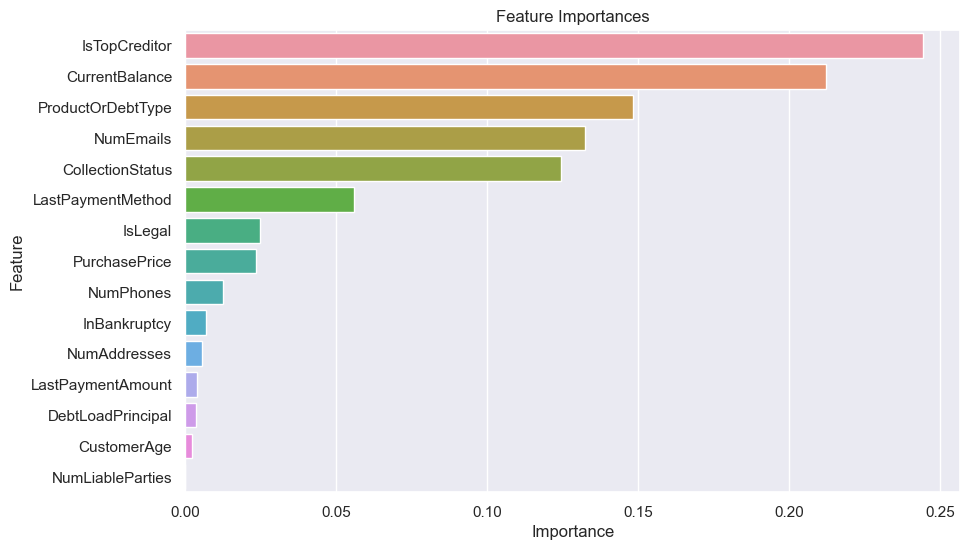

In [117]:
# Get feature importances
feature_importance = xgb_model.feature_importances_

# Create a DataFrame to associate feature names with their importances
feature_importance_df = pd.DataFrame({'Feature': X_train.columns, 'Importance': feature_importance})

# Sort the features by importance in descending order
feature_importance_df = feature_importance_df.sort_values(by='Importance', ascending=False)

# Print or visualize the feature importances
print(feature_importance_df)

import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(10, 6))
sns.barplot(x='Importance', y='Feature', data=feature_importance_df)
plt.title('Feature Importances')
plt.show()


Top 5 feature: IsTopCreditor(Creditor), Collection status, Current balance,Number of emails, Product or debt type



Certainly, based on the top 5 important features identified throughXGBoost modeling (i.e., 'OriginalCreditor[Redacted],' 'Collection Status,' 'Current Balance,' 'Number of Emails,' and 'Product or Debt Type') and the target variable "IsStatBarred," here are some additional insights and considerations:

1. **'OriginalCreditor[Redacted]':** The fact that 'OriginalCreditor[Redacted]' is a top feature suggests that the choice of the original creditor plays a significant role in determining the statute-barred status and the likelihood of debt collection. It implies that certain creditors might have a higher incidence of statute-barred cases, which could be attributed to their lending practices or customer base.

2. **'Collection Status':** The high importance of 'Collection Status' reaffirms its critical role in the model. It's a strong indicator of the probability of successful debt collection. You can delve deeper into how different collection statuses relate to statute-barred cases and how this affects the overall debt collection strategy.

3. **'Current Balance':** 'Current Balance' remains an essential factor in predicting statute-barred cases. It indicates that the outstanding debt amount is a critical determinant of the statute-barred status. You might want to explore at what balance thresholds cases tend to become statute-barred.

4. **'Number of Emails':** The prominence of 'Number of Emails' suggests that the communication and engagement level with customers through email contacts may play a vital role in debt collection outcomes. You can investigate how the number of email contacts influences the statute-barred status and whether increasing email communication can improve collection success.

5. **'Product or Debt Type':** The 'Product or Debt Type' being an important feature implies that different types of debts or products exhibit varying statute-barred characteristics. This could lead to tailored collection strategies based on the debt type. Investigate which debt types are more prone to becoming statute-barred and how they should be managed.

Incorporating these insights from the top 5 features into debt collection strategies can help optimize our efforts, improve risk assessment, and enhance the probability of successfully collecting debts while effectively addressing statute-barred cases.

At the same we come to know that the features with missing values has no contribution, so removing them would be a better option.